<a href="https://colab.research.google.com/github/wangyidong3/RAFT/blob/master/ptlflow_demo_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PTLFlow train demo

This notebook will show you how to train an optical flow model in PTLFlow ([https://github.com/hmorimitsu/ptlflow](https://github.com/hmorimitsu/ptlflow)) and then use the learned the weights to predict the optical flow between a pair of images.

Since fully training the model would take too long, in this demo we just make the model learn to predict the flow for one single example. However, the same instructions could be used to train the optical flow model on a larger dataset.

More details can be found in the official documentation at [https://ptlflow.readthedocs.io/](https://ptlflow.readthedocs.io/).

*It is recommended to use a node with a GPU backend to run this notebook (it should be the default).

In [ ]:
# First install the PTLFlow package with pip
!pip install ptlflow

     |████████████████████████████████| 289 kB 4.3 MB/s 
     |████████████████████████████████| 332 kB 22.2 MB/s 
     |████████████████████████████████| 26.5 MB 52.0 MB/s 
     |████████████████████████████████| 526 kB 45.2 MB/s 
     |████████████████████████████████| 48 kB 4.7 MB/s 
     |████████████████████████████████| 596 kB 36.1 MB/s 
     |████████████████████████████████| 829 kB 41.0 MB/s 
     |████████████████████████████████| 132 kB 44.8 MB/s 
     |████████████████████████████████| 1.1 MB 46.5 MB/s 
     |████████████████████████████████| 192 kB 46.7 MB/s 
     |████████████████████████████████| 160 kB 48.6 MB/s 
     |████████████████████████████████| 271 kB 49.5 MB/s 
  Created wheel for future: filename=future-0.18.2-py3-none-any.whl size=491070 sha256=081faf4918bbd568873a65a3da5a318d848393c3620c1452000abae56623cf2c
  Stored in directory: /root/.cache/pip/wheels/56/b0/fe/4410d17b32f1f0c3cf54cdfb2bc04d7b4b8f4ae377e2229ba0
Successfully built future
  Attempting uninstal

## Preparation

We first import the required libraries and prepare the data for the training.

In [ ]:
# Import ptlflow and some dependencies for the example
import ptlflow
from ptlflow.utils import flow_utils

import cv2 as cv
from google.colab.patches import cv2_imshow

%load_ext tensorboard

ERROR: torch_scatter not found. CSV requires torch_scatter library to run. Check instructions at: https://github.com/rusty1s/pytorch_scatter


In [ ]:
# We create a reduced version of the MPI-Sintel dataset, containing only one example.
# The MPI-Sintel dataset is available at http://sintel.is.tue.mpg.de/
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=16bj4FpJv06D4sOvyWPoiiFOHj0Z-Isnj' -O frame_0001.png
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1SAfygYqIOH410PdL8Q_et49nEQLycm7_' -O frame_0002.png
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1A0KUvt0pr6RTlvQTIUzzNSP3bx46eVm7' -O frame_0001.flo
!mkdir -p MPI-Sintel/training/clean/alley_1
!mkdir -p MPI-Sintel/training/flow/alley_1
!mv frame_0001.flo MPI-Sintel/training/flow/alley_1/
!mv frame_000*.png MPI-Sintel/training/clean/alley_1/

--2022-01-03 03:39:18--  https://docs.google.com/uc?export=download&id=16bj4FpJv06D4sOvyWPoiiFOHj0Z-Isnj
Resolving docs.google.com (docs.google.com)... 74.125.204.101, 74.125.204.113, 74.125.204.102, ...
Connecting to docs.google.com (docs.google.com)|74.125.204.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-08-1s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ohkmo0509m3aqj81ntmqtsm5lnnasjab/1641181125000/14350869204880266250/*/16bj4FpJv06D4sOvyWPoiiFOHj0Z-Isnj?e=download [following]
--2022-01-03 03:39:18--  https://doc-08-1s-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ohkmo0509m3aqj81ntmqtsm5lnnasjab/1641181125000/14350869204880266250/*/16bj4FpJv06D4sOvyWPoiiFOHj0Z-Isnj?e=download
Resolving doc-08-1s-docs.googleusercontent.com (doc-08-1s-docs.googleusercontent.com)... 74.125.23.132, 2404:6800:4008:c02::84
Connecting to doc-08-1s-docs.googleusercontent.com (doc-08-1s-do

In [ ]:
# Download the scripts from PTLFlow to do the training, validation, and inference.
ptlflow.download_scripts()
%cd ptlflow_scripts

01/03/2022 03:39:24 - INFO: Downloaded scripts to ptlflow_scripts.


/content/ptlflow_scripts


In [ ]:
# Add the path of the MPI-Sintel dataset to datasets.yml.
# This is just to simplify this demo. It is better to just edit datasets.yml and
# change the corresponding path without removing everything else.
!echo "mpi_sintel: ../MPI-Sintel" > datasets.yml

## Training

Once the data is ready, we can start the actual training.

We will monitor the training progress on Tensorboard.

By default, the training outputs will be saved to `ptlflow_logs`.

In [ ]:
# Initialize tensorboard to see the training progress.
# At any time during the training you can press the refresh button in the tensorboard
# below to update the visualization.

# The images are specially interesting to see how the prediction evolves during the training
%tensorboard --logdir ptlflow_logs

<IPython.core.display.Javascript object>

In [ ]:
# Use the training script we downloaded before
# We will use the small RAFT model (see https://github.com/princeton-vl/RAFT) in this example.
# Other model options can be seen at https://ptlflow.readthedocs.io/en/latest/models/models_list.html
!python train.py raft_small \
  --gpus 1 \
  --train_dataset overfit-sintel \
  --val_dataset none \
  --train_batch_size 1 \
  --max_epochs 100 \
  --lr 1e-3
# This learning rate is probably too large for a real training

/usr/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/usr/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
ERROR: torch_scatter not found. CSV requires torch_scatter library to run. Check instructions at: https://github.com/rusty1s/pytorch_scatter
Global seed set to 1234
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
01/03/2022 03:39:43 - WARNING: --train_crop_size is not set. It will be set as (432, 1024).
01/03/2022 03:39:43 - INFO: Loading 1 samples from Sintel_clean dataset.

  | Name          | Type             | Params
---------------------------------------------------
0 | loss_fn   

## Inference

After the training is concluded, the learned weights will be saved to the disk, and can be used to predict the optical flow in other images.

The code below shows how to use the downloaded `infer.py` script to load the trained model and predict the optical flow between a pair of images.

In [ ]:
# Just for this example, we use the same images as the training, but normally these will be different images.
!python infer.py raft_small \
  --input_path ../MPI-Sintel/training/clean/alley_1/frame_0001.png ../MPI-Sintel/training/clean/alley_1/frame_0002.png \
  --pretrained_ckpt ptlflow_logs/raft_small-overfit/default/version_0/checkpoints/raft_small_last_epoch\=99_step\=99.ckpt \
  --write_outputs

ERROR: torch_scatter not found. CSV requires torch_scatter library to run. Check instructions at: https://github.com/rusty1s/pytorch_scatter
  0% 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 1/1 [00:00<00:00,  2.09it/s]


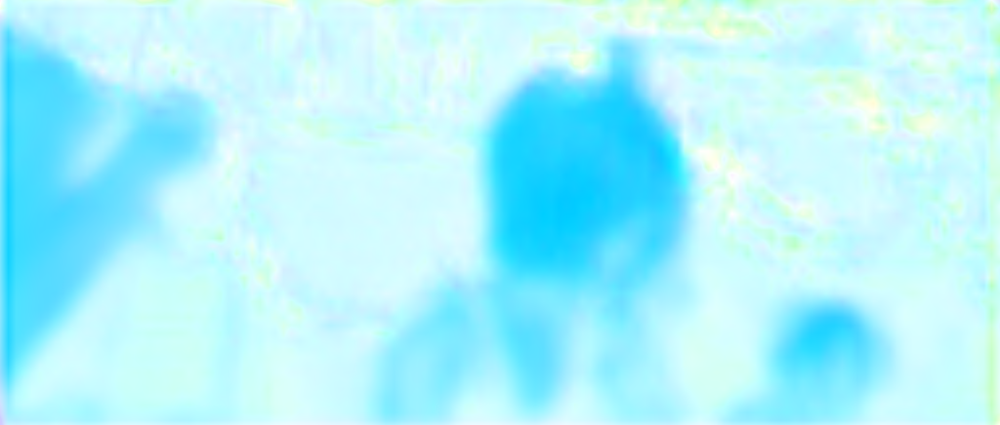

In [ ]:
# Let's vizualize the predicted flow
flow_viz = cv.imread('outputs/inference/flows_viz/frame_0001.png')
cv2_imshow(flow_viz)

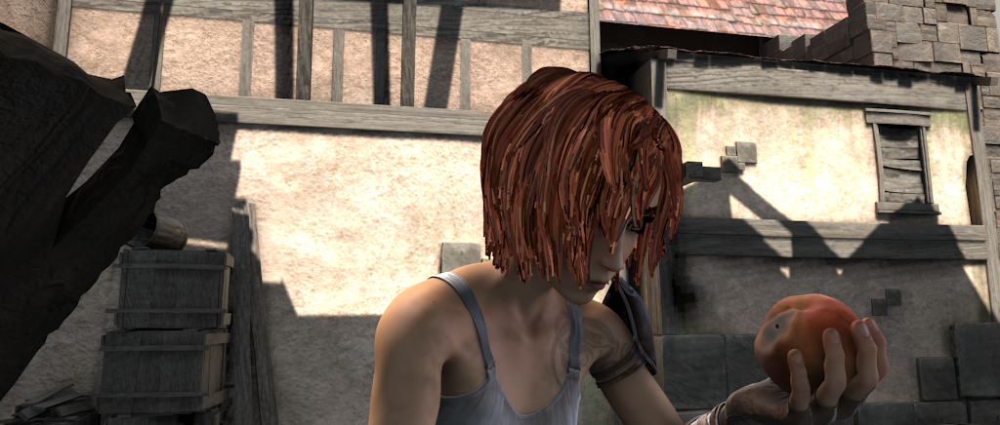

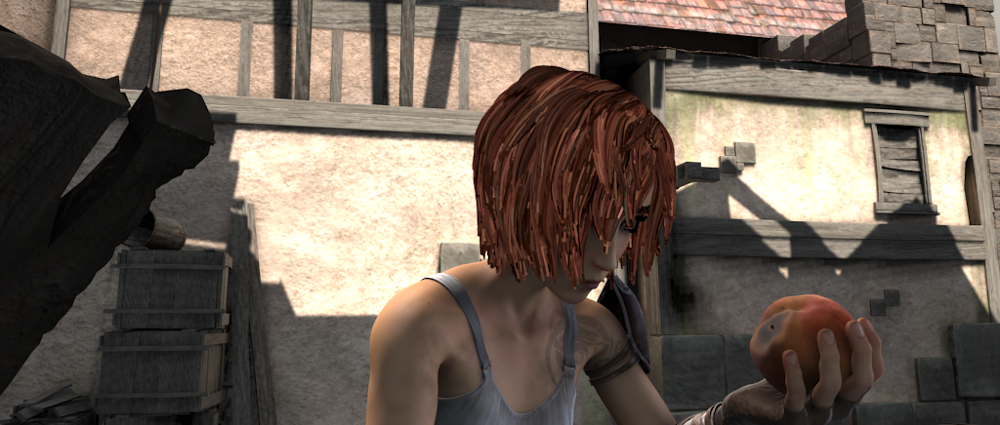

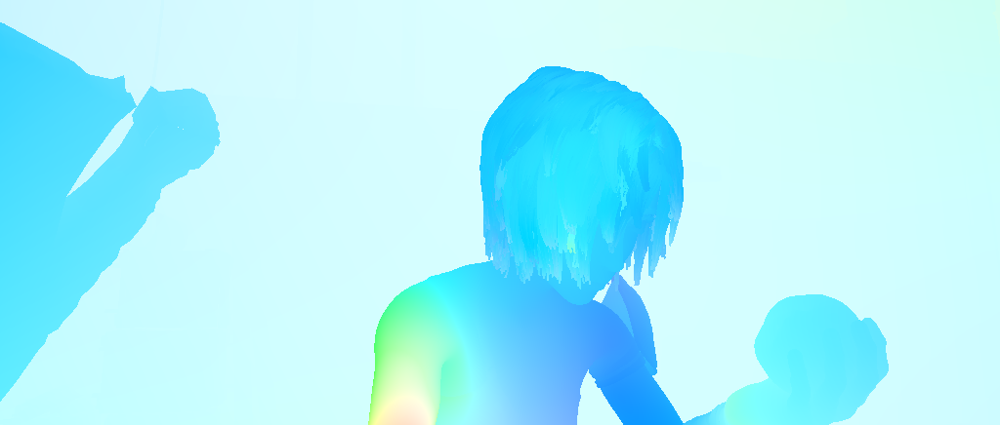

In [ ]:
# We can load the original images and the grooundtruth optical flow to compare to the prediction
img1 = cv.imread('../MPI-Sintel/training/clean/alley_1/frame_0001.png')
img2 = cv.imread('../MPI-Sintel/training/clean/alley_1/frame_0002.png')
flow_gt = flow_utils.flow_read('../MPI-Sintel/training/flow/alley_1/frame_0001.flo')
flow_gt_viz = flow_utils.flow_to_rgb(flow_gt)
flow_gt_viz = cv.cvtColor(flow_gt_viz, cv.COLOR_RGB2BGR)
cv2_imshow(img1)
cv2_imshow(img2)
cv2_imshow(flow_gt_viz)

Probably, the predicted optical flow is not very good. But that is to be expected, as we are training from scratch for only a few iterations.

The example below shows the results when we use the larger RAFT model trained on real datasets.

ERROR: torch_scatter not found. CSV requires torch_scatter library to run. Check instructions at: https://github.com/rusty1s/pytorch_scatter
Downloading: "https://github.com/hmorimitsu/ptlflow/releases/download/weights1/raft-things-802bbcfd.ckpt" to /root/.cache/torch/hub/ptlflow/checkpoints/raft-things-802bbcfd.ckpt
100% 20.1M/20.1M [00:01<00:00, 15.8MB/s]
  0% 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 1/1 [00:00<00:00,  1.14it/s]


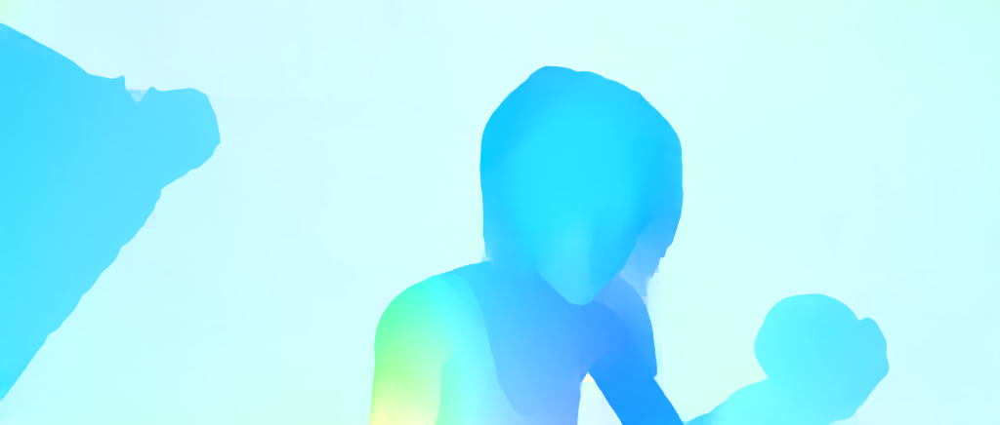

In [ ]:
!python infer.py raft \
  --input_path ../MPI-Sintel/training/clean/alley_1/frame_0001.png ../MPI-Sintel/training/clean/alley_1/frame_0002.png \
  --pretrained_ckpt things \
  --write_outputs \
  --output_path outputs/inference_things
flow_viz2 = cv.imread('outputs/inference_things/flows_viz/frame_0001.png')
cv2_imshow(flow_viz2)